In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import diffxpy.api as de
import time
from scipy import sparse

import sys  
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/mm_pancreas_atlas_rep/code/')
from importlib import reload  
import helper
reload(helper)
import helper as h
from constants import SAVE
import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr
#sc.settings.verbosity = 3

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
#library(Seurat)

In [4]:
# Path for saving results - last shared folder by all datasets
shared_folder='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/GSE132188/rev7/'
UID2='embryo_annotation'

Load data:

In [5]:
#Load data
#adata=pickle.load(  open( shared_folder+"data_normalised.pkl", "rb" ) )
adata=h.open_h5ad(shared_folder+"data_normalised.h5ad",unique_id2=UID2)

## Add previously generated annotation

In [6]:
# Add previously generated annotation 
#adata_preannotated=h.open_h5ad("/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/salinno_project/rev4/maren/data_endo_final.h5ad",unique_id2=UID2)
adata_preannotated=h.open_h5ad("/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/GSE132188/rev7/preannotated/GSE132188_adata.h5ad.h5",unique_id2=UID2)

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/compat/__init__.py:158: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/anndata/compat/__init__.py:158: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [7]:
adata_preannotated

AnnData object with n_obs × n_vars = 36351 × 17327
    obs: 'day', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'proliferation', 'G2M_score', 'S_score', 'clusters_fig3_final', 'clusters_fig3_final_noep', 'clusters_fig4_final', 'clusters_fig2_final', 'clusters_fig6_broad_final', 'clusters_fig6_fine_final', 'clusters_fig6_alpha_final'
    var: 'n_cells', 'highly_variable_genes', 'expression_mean', 'dispersion'
    uns: 'Ngn3+_colors', 'PCs_loading_hvg', 'clusters_fig2_final_colors', 'clusters_fig3_final_colors', 'clusters_fig3_final_noep_colors', 'clusters_fig4_final_colors', 'clusters_fig6_alpha_final_colors', 'clusters_fig6_broad_final_colors', 'clusters_fig6_fine_final_colors', 'day_colors', 'neighbors', 'pca', 'proliferation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [8]:
# Subset preannotated dataset obs and order it to match current dataset
preannotated_obs=adata_preannotated.obs.copy()
# Match idx
new_idx=[]
for idx in preannotated_obs.index:
    idx='-'.join(idx.split('-')[:-1])+'-E'+preannotated_obs.at[idx,'day'].replace('.','_')
    new_idx.append(idx)
preannotated_obs.index=new_idx
preannotated_obs=preannotated_obs.reindex( adata.obs.index)

In [9]:
# Add pre-prepared cell type annotation to currently used dataset
# Add 'pre_' before each original annotation
for annotation in ['clusters_fig3_final', 'clusters_fig3_final_noep', 'clusters_fig4_final', 'clusters_fig2_final', 'clusters_fig6_broad_final', 'clusters_fig6_fine_final', 'clusters_fig6_alpha_final']:
    annotation_new='pre_'+annotation
    # Data was sorted before - remove index as they do not match
    adata.obs[annotation_new]=preannotated_obs[annotation].values
    # Replace np.nan with na
    adata.obs[annotation_new] = adata.obs[annotation_new].cat.add_categories('NA')
    adata.obs[annotation_new].fillna('NA', inplace =True) 
    # Remove unused categories
    adata.obs[annotation_new].cat.remove_unused_categories(inplace=True)

Pre-annotated cell type count

In [10]:
# Count of cells per annotation
for annotation in ['clusters_fig3_final', 'clusters_fig3_final_noep', 'clusters_fig4_final', 'clusters_fig2_final', 'clusters_fig6_broad_final', 'clusters_fig6_fine_final', 'clusters_fig6_alpha_final']:
    # For some reason the same line above does not remove all categories, thus it is done here again
    adata.obs['pre_'+annotation].cat.remove_unused_categories(inplace=True)
    print('pre_'+annotation,':')
    print(adata.obs['pre_'+annotation].value_counts())

pre_clusters_fig3_final :
Mat. Acinar     6972
Ductal          4262
Tip             3796
Prlf. Acinar    3289
Endocrine       2987
Ngn3 low EP     2582
Ngn3 high EP    2493
Prlf. Ductal    2298
Prlf. Tip       2193
Fev+            2058
NA              1641
Prlf. Trunk     1188
Multipotent     1187
Trunk            615
Name: pre_clusters_fig3_final, dtype: int64
pre_clusters_fig3_final_noep :
Mat. Acinar     6972
Ductal          5746
Tip             3969
Prlf. Acinar    3289
Endocrine       2987
Prlf. Ductal    2947
Ngn3 high EP    2493
Prlf. Tip       2308
Fev+            2058
NA              1641
Prlf. Trunk     1237
Multipotent     1206
Trunk            708
Name: pre_clusters_fig3_final_noep, dtype: int64
pre_clusters_fig4_final :
Excluded           22227
Ductal Bipotent     6560
Ngn3 low EP         2582
Ngn3 high EP        2493
Fev+                2058
NA                  1641
Name: pre_clusters_fig4_final, dtype: int64
pre_clusters_fig2_final :
Acinar         10261
Ductal          

In [11]:
# Set one annotation column to pre_cell_type to enable below code to work
adata.obs.rename(columns={'pre_clusters_fig6_broad_final':'pre_cell_type'}, inplace=True)

## Visualisation

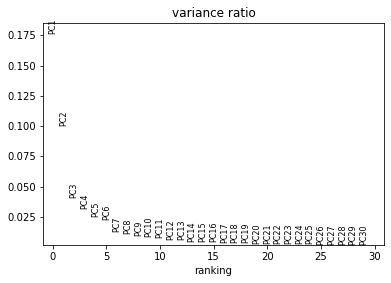

In [12]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [13]:
# Select number of PCs to use
N_PCS=11

Compare different embeddings based on previously defined annotation. 

In [14]:
#sc.pp.neighbors(adata,n_pcs = N_PCS,metric='correlation') 
#sc.tl.umap(adata)

In [15]:
#rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

In [16]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'

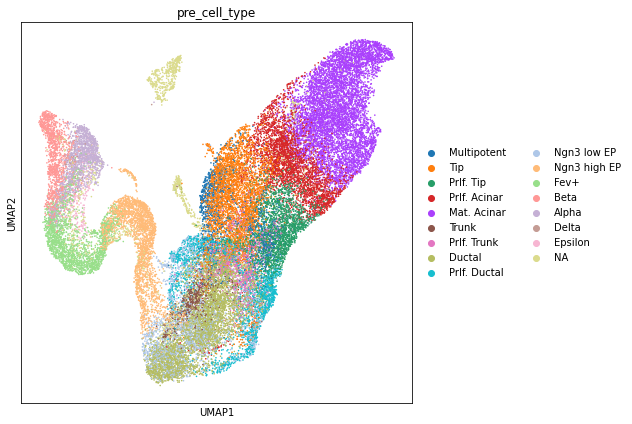

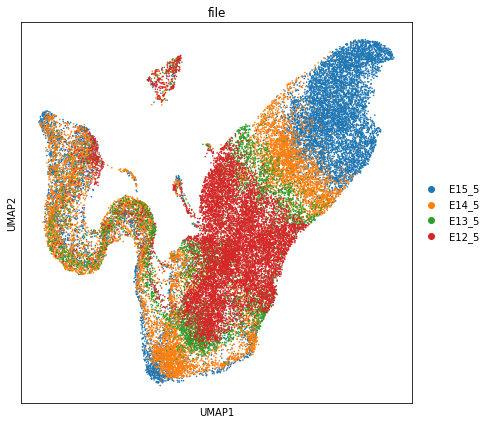

In [17]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata,size=10,color=['pre_cell_type'])
sc.pl.umap(adata,size=10,color=['file'])

#### On scaled data

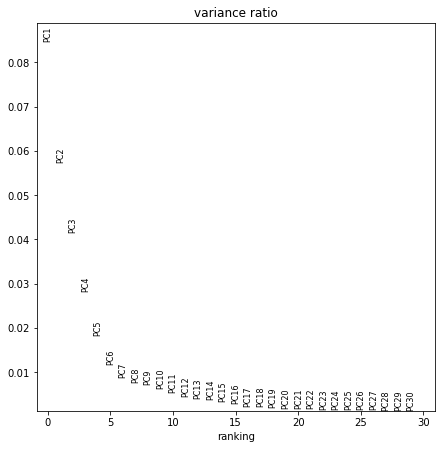

In [18]:
# Scale data and perform PCA
adata_scl=adata.copy()
sc.pp.scale(adata_scl,max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_scl)

In [19]:
#C: Can not stay the same as above
N_PCS

11

In [20]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = 16) 

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities


In [21]:
# Umap on scaled data
sc.tl.umap(adata_scl)

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'].tocoo(),


In [22]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

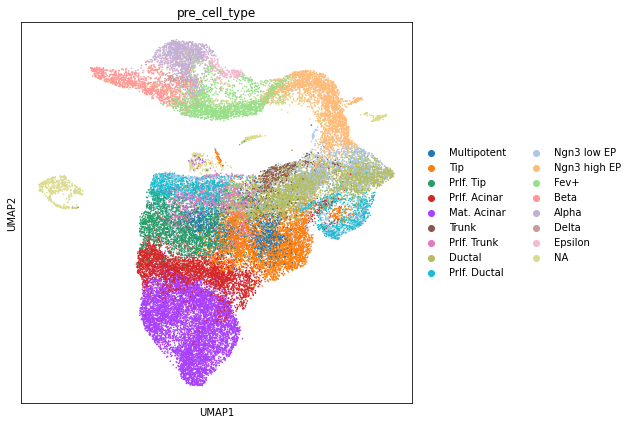

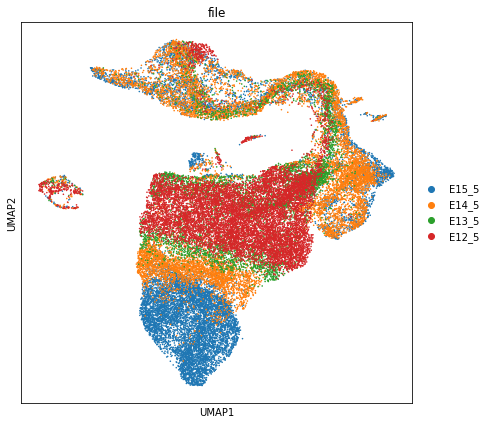

In [23]:
rcParams['figure.figsize']=(7,7)
sc.pl.umap(adata_scl,size=10,color=['pre_cell_type'])
sc.pl.umap(adata_scl,size=10,color=['file'])

## Cell cycle
Performed separately for individual batches.

### Seurat/Scanpy - score by G2M and S

In [24]:
# Load mouse cell cycle genes
cell_cycle_mm=pd.read_table('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/cell_cycle_mm_Macosko2015.tsv',sep='\t')

Use cell cycle genes that overlap HVGs (from different batches). Display these genes on HVG plots (with non-phase genes being marked as .NA).

Use G2/M and M gene sets for G2/M annotation and S gene set for S annotation.

G1/S N genes: 92 overlap var: 90 overlap hvg (all): 20
S N genes: 96 overlap var: 95 overlap hvg (all): 17
G2/M N genes: 127 overlap var: 126 overlap hvg (all): 32
M N genes: 143 overlap var: 142 overlap hvg (all): 27
M/G1 N genes: 108 overlap var: 106 overlap hvg (all): 9
N genes for scoring S: 17 and G2/M: 59


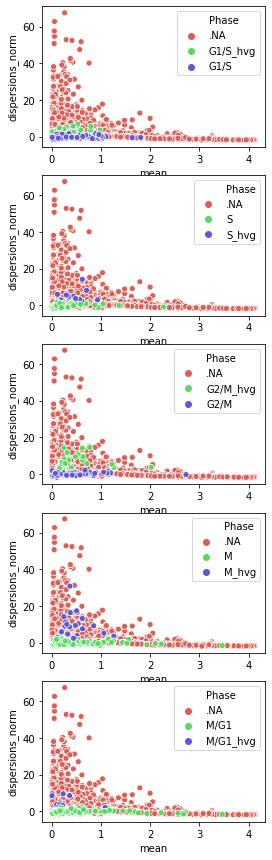

In [25]:
# How many of the cell cycle phase genes are present in HVG and in var and how variable they are
hvg=set(adata.var_names[adata.var.highly_variable])
i=0
rcParams['figure.figsize']=(4,15)
fig,axs=plt.subplots(5)
s_hvg=[]
g2m_hvg=[]
for phase in cell_cycle_mm.Phase.unique():
    genes_phase = set(cell_cycle_mm.query('Phase =="'+phase+'"').Gene)
    overlap_var = set(adata.var_names) & genes_phase
    overlap_hvg = hvg & genes_phase
    print(phase,'N genes:',len(genes_phase),'overlap var:',len(overlap_var),'overlap hvg (all):',len(overlap_hvg))
    phase_df=pd.DataFrame([phase]*len(overlap_var),index=overlap_var,columns=['Phase']).reindex(adata.var_names).fillna('.NA').sort_values('Phase')
    phase_df.loc[overlap_hvg,'Phase']=phase+'_hvg'
    phase_df['mean']=adata.var.means
    phase_df['dispersions_norm']=adata.var.dispersions_norm
    sb.scatterplot(x="mean", y="dispersions_norm", hue="Phase",data=phase_df,ax=axs[i],palette='hls')
    i+=1
    if phase == 'S':
        s_hvg.extend(overlap_hvg)
    if phase in ['G2/M','M']:
        g2m_hvg.extend(overlap_hvg)
        
print('N genes for scoring S:',len(s_hvg),'and G2/M:',len(g2m_hvg))

Cell cycle annotation

In [26]:
# Annotated cell cycle per batch
adata.obs['S_score']= np.zeros(adata.shape[0])
adata.obs['G2M_score'] = np.zeros(adata.shape[0])
adata.obs['phase'] = np.zeros(adata.shape[0])

for batch in enumerate(adata.obs['file'].cat.categories):
    batch=batch[1]
    idx = adata.obs.query('file=="'+batch+'"').index
    adata_tmp = adata[idx,:].copy()
    sc.tl.score_genes_cell_cycle(adata_tmp, s_genes=s_hvg, g2m_genes=g2m_hvg,use_raw=False)
    adata.obs.loc[idx,'S_score'] = adata_tmp.obs['S_score']
    adata.obs.loc[idx,'G2M_score'] = adata_tmp.obs['G2M_score']
    adata.obs.loc[idx,'phase'] = adata_tmp.obs['phase']
    
del adata_tmp

In [27]:
# Count of cells annotated to each phase
adata.obs['phase'].value_counts()

G1     17583
S      13073
G2M     6905
Name: phase, dtype: int64

Display cell cycle score distributions and annotation.

... storing 'phase' as categorical


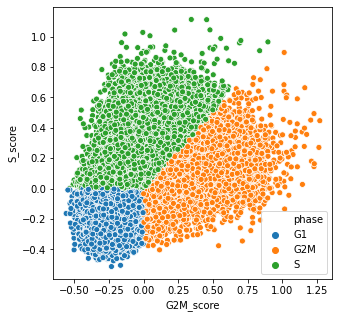

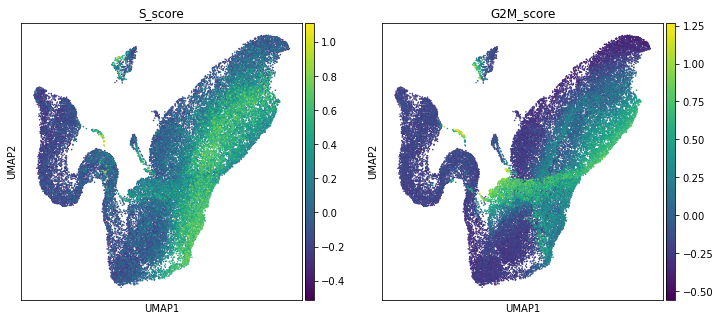

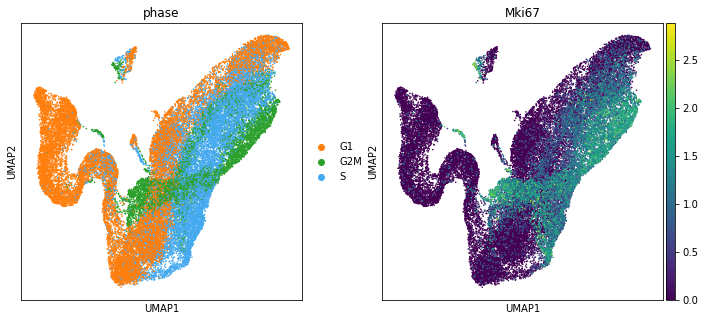

In [28]:
adata.uns['phase_colors']=['#ff7f0e', '#2ca02c','#46aaf0']

rcParams['figure.figsize']=(5,5)
sb.scatterplot(x='G2M_score',y='S_score',hue='phase',data=adata.obs)
sc.pl.umap(adata, color=['S_score', 'G2M_score'], size=10, use_raw=False)
sc.pl.umap(adata, color=['phase','Mki67'], size=10, use_raw=False)

#C: There might seem to be some proliferating populations and the non-cyclone based annotation actually works well here.

#### Check expression of S and G2M HVGs

In [40]:
set(s_hvg)&set(g2m_hvg)

{'Top2a'}

In [41]:
print('S and G2M marker set overlap %i out of %i S and %i G2M HVGs'%
      (len(set(s_hvg)&set(g2m_hvg)), len(s_hvg), len(g2m_hvg)))

S and G2M marker set overlap 1 out of 17 S and 59 G2M HVGs


S HVG


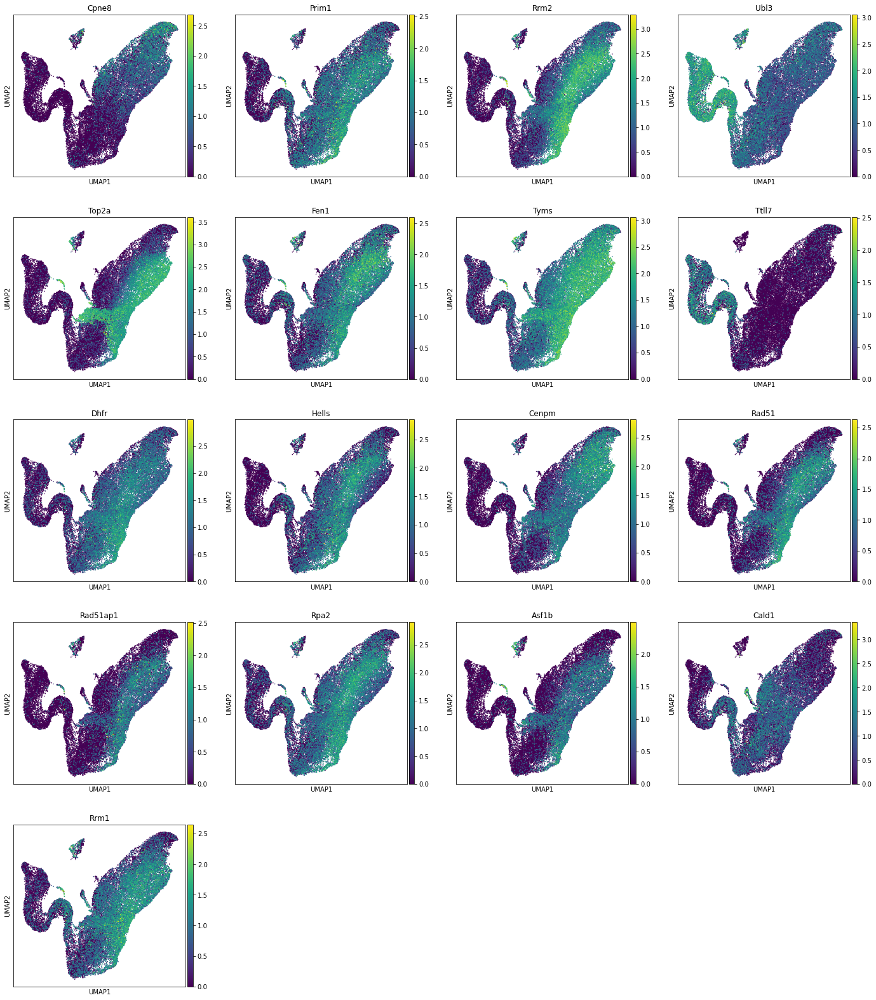

G2M HVG


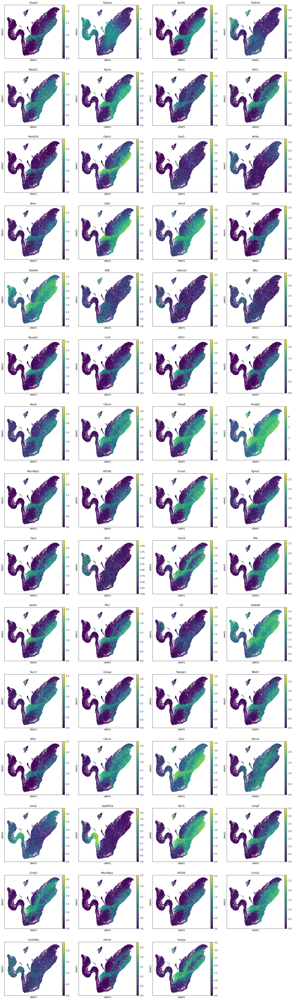

In [42]:
print('S HVG')
sc.pl.umap(adata, color=s_hvg, size=10, use_raw=False)
print('G2M HVG')
sc.pl.umap(adata, color=g2m_hvg, size=10, use_raw=False)

#C: Some of the markerts are not consistent and G2M and S patterns are hard to distinguish.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [29]:
# Adata genes for R
genes=adata.var_names

#C: Current Ensembl release 101

In [30]:
%%R -i genes -o gene_ids
# Extract Ensembl gene IDs
mouse = useMart("ENSEMBL_MART_ENSEMBL", dataset = "mmusculus_gene_ensembl",version='Ensembl Genes 101',
                host="https://www.ensembl.org")
gene_ids = getBM(attributes = c("mgi_symbol",'ensembl_gene_id'), 
                 filters = "mgi_symbol", values = genes , mart = mouse, uniqueRows=FALSE)

In [31]:
# Add gene ids to adata, use only genes with unique mapped ensembl ids
gene_ids.drop_duplicates(subset='mgi_symbol', keep=False, inplace=True)
gene_ids.index=gene_ids.mgi_symbol
gene_ids=gene_ids.reindex(list(adata.var_names))
adata.var['EID']=gene_ids.ensembl_gene_id

In [32]:
# Prepare R data for cyclonee
x_mat=adata.X.T
gene_ids=adata.var.EID
batches=adata.obs.file
cells=adata.obs.index

In [33]:
%%R -i x_mat -i gene_ids -i batches -i cells -o cyclone_anno
# Cyclone cell scores, calculated separately for each batch
mm.pairs <- readRDS(system.file("exdata", "mouse_cycle_markers.rds", package="scran"))
phases<-c()
s<-c()
g2m<-c()
g1<-c()
cells_order<-c()
for(batch in unique(batches)){
    # Select batch data
    x_mat_batch=x_mat[,batches==batch]
    print(batch,dim(x_mat_batch[1]))
    # Scores
    assignments <- cyclone(x_mat_batch, mm.pairs, gene.names=gene_ids,BPPARAM=MulticoreParam(workers = 16))
    phases<-c(phases,assignments$phases)
    s<-c(s,assignments$score$S)
    g2m<-c(g2m,assignments$score$G2M)
    g1<-c(g1,assignments$score$G1)
    # Save cell order
    cells_order<-c(cells_order,cells[batches==batch])
}
cyclone_anno<-data.frame(phase_cyclone=phases,s_cyclone=s,g2m_cyclone=g2m,g1_cyclone=g1)
rownames(cyclone_anno)<-cells_order

[1] "E15_5"
[1] "E14_5"
[1] "E13_5"
[1] "E12_5"


In [34]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     30424
G2M     6037
S       1100
Name: phase_cyclone, dtype: int64

In [35]:
# Add cyclone annotation to adata
cyclone_anno=cyclone_anno.reindex(adata.obs.index)
adata.obs=pd.concat([adata.obs,cyclone_anno],axis=1)

... storing 'phase_cyclone' as categorical
... storing 'EID' as categorical


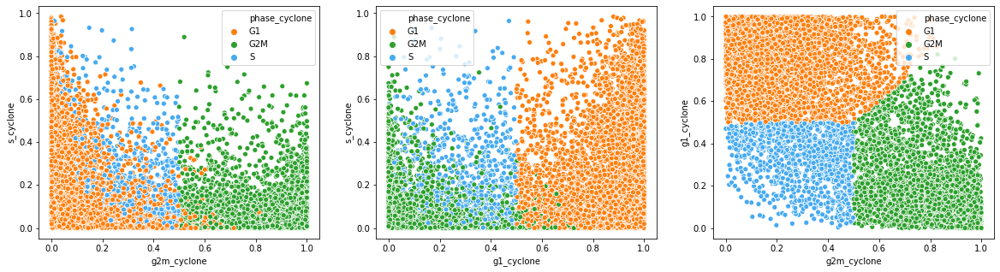

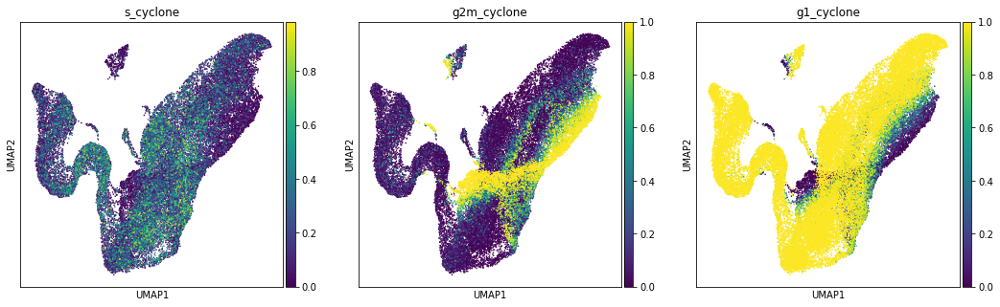

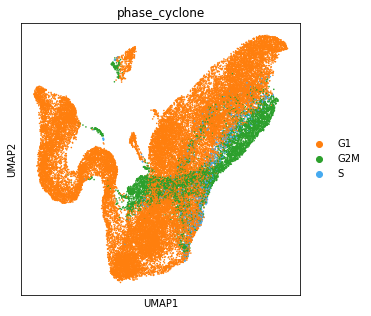

In [36]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize']=(20,5)
fig,axs=plt.subplots(1,3)
palette=sb.color_palette(['#ff7f0e', '#2ca02c','#46aaf0'])
sb.scatterplot(x='g2m_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[0],palette=palette)
sb.scatterplot(x='g1_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[1],palette=palette)
sb.scatterplot(x='g2m_cyclone',y='g1_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[2],palette=palette)
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone','g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors']=['#ff7f0e', '#2ca02c','#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

Check previous annotation results

In [37]:
for annotation in ['proliferation', 'G2M_score', 'S_score']:
    annotation_new='pre_'+annotation
    # Data was sorted before - remove index as they do not match
    adata.obs[annotation_new]=preannotated_obs[annotation].values
    # Replace np.nan with 'NA' if it is categorical
    if adata.obs[annotation_new].dtype.name=='category':
        adata.obs[annotation_new] = adata.obs[annotation_new].cat.add_categories('NA')
        adata.obs[annotation_new].fillna('NA', inplace =True) 
        # Remove unused categories
        adata.obs[annotation_new].cat.remove_unused_categories(inplace=True)

In [38]:
adata.obs.columns

Index(['file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter',
       'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet',
       'doublet_score_filter', 'size_factors', 'pre_clusters_fig3_final',
       'pre_clusters_fig3_final_noep', 'pre_clusters_fig4_final',
       'pre_clusters_fig2_final', 'pre_cell_type',
       'pre_clusters_fig6_fine_final', 'pre_clusters_fig6_alpha_final',
       'S_score', 'G2M_score', 'phase', 'phase_cyclone', 's_cyclone',
       'g2m_cyclone', 'g1_cyclone', 'pre_proliferation', 'pre_G2M_score',
       'pre_S_score'],
      dtype='object')

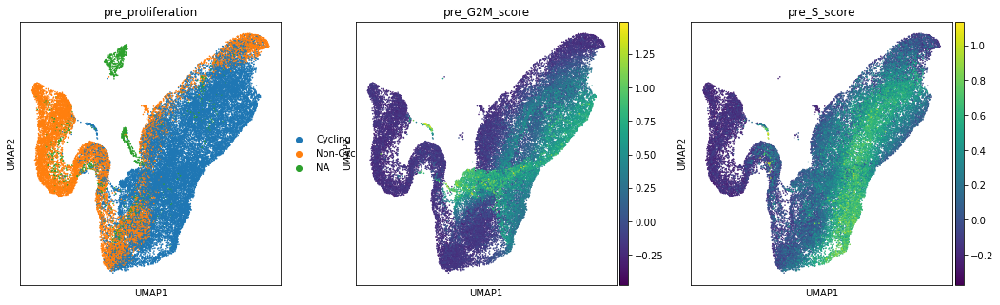

In [39]:
# Non-categorical variables do not show np.nan cells
sc.pl.umap(adata, color=['pre_proliferation', 'pre_G2M_score', 'pre_S_score'], size=10, use_raw=False)

#C: Here cyclone does not seem to perform substantially better than gene scoring approach. However, as it performed better on other datasets it will still be used as it seems to be more reliable (but conservative).

## Sex scores
#C: Sex determination already happeens at this age. e.g. Uty (one of the used Y HVGs) is already exprressed at E12.5 (https://journals.plos.org/plosgenetics/article?id=10.1371/journal.pgen.1002964).

Extract expressed genes from X and Y chromosome and score their expression, separately for each batch.

Add chromosome information:

In [43]:
# Gene names for R for chromosome assignment
genes=adata.var_names

In [44]:
%%R -i genes -o genes_chr
# Chromosome assignment 

mouse = useMart("ENSEMBL_MART_ENSEMBL", dataset = "mmusculus_gene_ensembl",version='Ensembl Genes 101',
                host="https://www.ensembl.org")
# Return duplicated results - e.g. one gene being annotated to multiple chromosomes
genes_chr = getBM(attributes = c("mgi_symbol",'chromosome_name'), filters = "mgi_symbol", values = genes , mart = mouse, uniqueRows=F)


In [45]:
# Remove genes annotated to non-standard chromosomes and 
# confirm that each gene is now annotated to only one chromosome
mouse_chromosomes=[str(i) for i in range(1,20)]+['X','Y','MT']
genes_chr_filtered=genes_chr.query('chromosome_name in @mouse_chromosomes')
#Remove duplicated rows (gene was returned multiple times with the same chromosome)
genes_chr_filtered=genes_chr_filtered.drop_duplicates()
print('Each gene has one annotated chromosome:',
      genes_chr_filtered.mgi_symbol.unique().shape[0]==genes_chr_filtered.shape[0])
print('N genes with chromosomes:',genes_chr_filtered.shape[0],'out of',adata.shape[1],'genes')

Each gene has one annotated chromosome: True
N genes with chromosomes: 17597 out of 17631 genes


In [46]:
# Add chromosomes in adata
genes_chr_filtered.index=genes_chr_filtered.mgi_symbol
genes_chr_filtered=genes_chr_filtered.reindex(adata.var_names)
adata.var['chromosome']=genes_chr_filtered['chromosome_name']

Extract X and Y HVGs and compare their number to all expressed X and Y genes.

In [47]:
# Select X and Y genes that are HVG
x_hvg = adata.var.query('chromosome=="X" & highly_variable').index
y_hvg = adata.var.query('chromosome=="Y" & highly_variable').index
print('X HVG:',len(x_hvg),'/',adata.var.query('chromosome=="X"').shape[0],
      'Y HVG:',len(y_hvg),'/',adata.var.query('chromosome=="Y"').shape[0])

X HVG: 95 / 565 Y HVG: 3 / 7


Show Y gene expression on UMAP.

... storing 'chromosome' as categorical


Y specific HVG


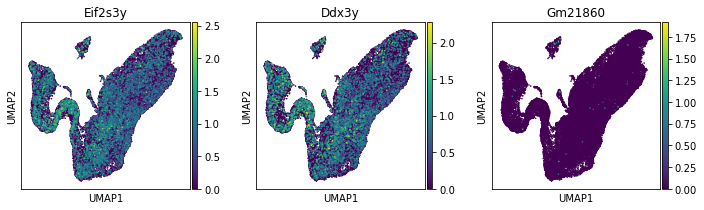

Y specific non-HVG


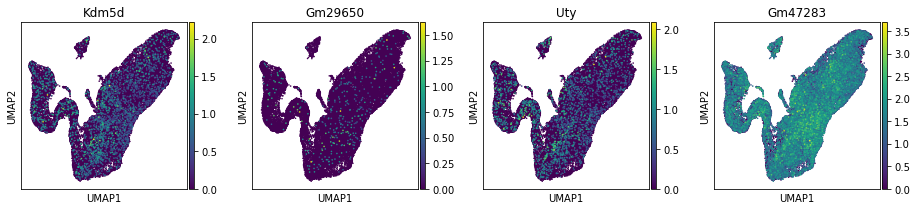

In [49]:
# Show Y HVGs and Y non-HVGs
rcParams['figure.figsize']=(3,3)
print('Y specific HVG')
sc.pl.umap(adata, color=y_hvg, size=10, use_raw=False)
print('Y specific non-HVG')
sc.pl.umap(adata, color=adata.var.query('chromosome=="Y"& ~highly_variable').index, size=10, use_raw=False)

#C: Due to low number of expressed Y genes both HVG and non-HVG genes will be used. Genes Gm47283, Gm29650, and Gm21860  will not be used for Y scoring due to low or too constant expression.
For X chromosome only HVG will be used. 

Score cells:

In [50]:
# Prepare final scoring gene sets for X and Y
y_all=adata.var.query('chromosome=="Y"').index
#C Remove these two genes for consistency with other datasets
y_selected=[gene for gene in y_all if gene not in ['Gm47283','Gm29650','Gm21860']]
x_selected=list(x_hvg)
print('N selected genes from Y:',len(y_selected),'and from X:',len(x_selected))

N selected genes from Y: 4 and from X: 95


In [51]:
#Do not use the smaller gene set as controll size as Y gene set is very small
#ctrl_size = min(len(x_genes), len(y_genes))

# For performing it on all batches together
#sc.tl.score_genes(adata, x_selected, score_name = 'x_score', use_raw=False)
#sc.tl.score_genes(adata, y_selected, score_name = 'y_score',use_raw=False)

# Compute sex score per batch
adata.obs['x_score']= np.zeros(adata.shape[0])
adata.obs['y_score'] = np.zeros(adata.shape[0])

for batch in enumerate(adata.obs['file'].cat.categories):
    batch=batch[1]
    idx = adata.obs.query('file=="'+batch+'"').index
    adata_tmp = adata[idx,:].copy()
    sc.tl.score_genes(adata_tmp, x_selected, score_name = 'x_score', use_raw=False)
    sc.tl.score_genes(adata_tmp, y_selected, score_name = 'y_score',use_raw=False)
    adata.obs.loc[idx,'y_score'] = adata_tmp.obs['y_score']
    adata.obs.loc[idx,'x_score'] = adata_tmp.obs['x_score']
    
del adata_tmp

Plot X and Y scores

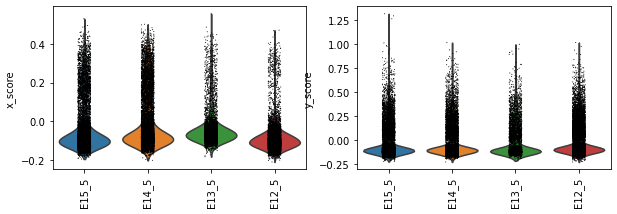

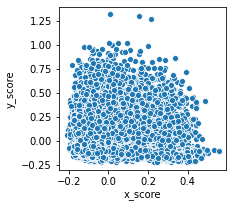

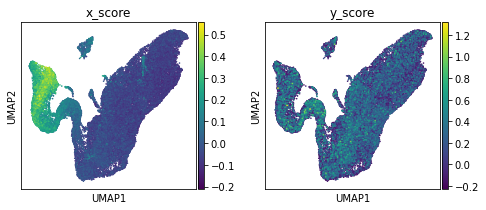

<AxesSubplot:xlabel='y_score'>

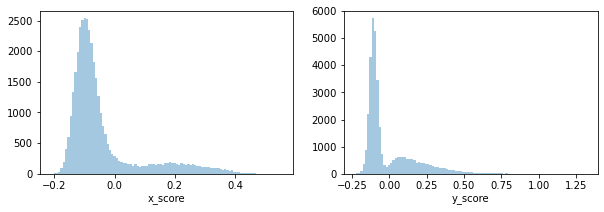

In [52]:
rcParams['figure.figsize']=(10,3)
fig,axs=plt.subplots(1,2)
# Scores across batches
sc.pl.violin(adata, ['x_score'], groupby='file', size=1, log=False,rotation=90,ax=axs[0],show=False)
sc.pl.violin(adata, ['y_score'], groupby='file', size=1, log=False,rotation=90,ax=axs[1],show=False)
plt.show()
# X vs Y score
rcParams['figure.figsize']=(3,3)
sb.scatterplot(x='x_score',y='y_score',data=adata.obs)
# Distribution of scores
sc.pl.umap(adata, color=['x_score','y_score'] ,size=10, use_raw=False)
rcParams['figure.figsize']=(10,3)
fig,axs=plt.subplots(1,2)
sb.distplot(adata.obs['x_score'],  kde=False,  bins=100,ax=axs[0])
sb.distplot(adata.obs['y_score'],  kde=False,  bins=100,ax=axs[1])

#C: There are two X and Y subpopulations, but they do not correspond. Based on UMAPs (above) some X genes may be enriched in certain cell types (and do not in fact indicate female origin). 

<AxesSubplot:xlabel='y_score'>

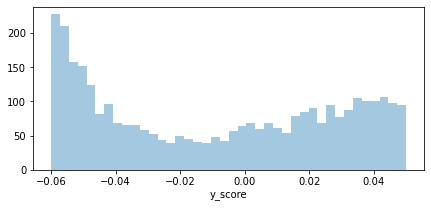

In [57]:
# More detailed plot of y_score region of interest
rcParams['figure.figsize']=(7,3)
sb.distplot(adata.obs.query('y_score>-0.06 & y_score<0.05')['y_score'],  kde=False,  bins=40)

... storing 'sex' as categorical


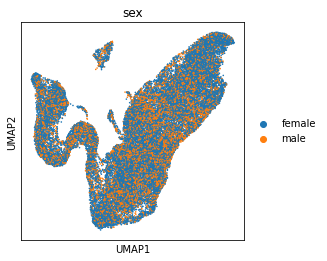

female    25204
male      12357
Name: sex, dtype: int64


In [58]:
adata.obs['sex']=(adata.obs['y_score']>=-0.02).replace(False,'female').replace(True,'male')

rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata, color=['sex'] ,size=10, use_raw=False)
print(adata.obs.sex.value_counts())

#C: Set male threshold at >= -0.02 (Score 0 means equal expression as a reference data set.)

## Save intermediate results before cell type annotation

In [59]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

# Cell type annotation

In [5]:
adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)

## Endo high annotation

In [6]:
# Normalise raw data for cell type scoring
adata_rawnorm=adata.raw.to_adata().copy()
adata_rawnorm.X /= adata.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_rawnorm)
adata_rawnorm.X = np.asarray(adata_rawnorm.X)
adata_rawnorm.obs=adata.obs.copy()

#### Ins

In [7]:
# Compute Ins score
sc.tl.score_genes(adata_rawnorm, gene_list=['Ins1','Ins2'], score_name='ins_score',  use_raw=False)

<ipython-input-14-8ee23e6c07cf>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ins_scores['ins_score_norm']=pp.minmax_scale(ins_scores.ins_score)


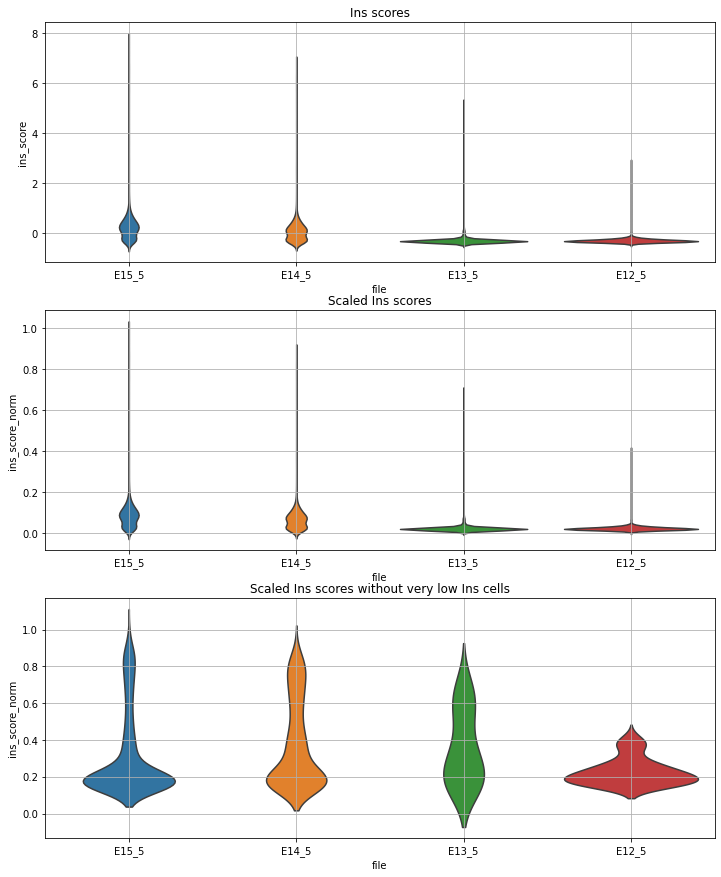

In [14]:
#sc.pl.violin(adata_rawnorm, keys=['ins_score'], groupby='file', stripplot=False, jitter=True)
ins_scores=adata_rawnorm.obs[['ins_score','file']]
ins_scores['ins_score_norm']=pp.minmax_scale(ins_scores.ins_score)
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y='ins_score',data=ins_scores,inner=None,ax=axs[0])
axs[0].title.set_text('Ins scores')
axs[0].grid()
sb.violinplot(x='file',y='ins_score_norm',data=ins_scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled Ins scores')
axs[1].grid()
sb.violinplot(x='file',y='ins_score_norm',data=ins_scores[ins_scores.ins_score_norm>0.15],inner=None,ax=axs[2])
axs[2].title.set_text('Scaled Ins scores without very low Ins cells')
axs[2].grid()

In [15]:
# Find ins high cells
adata_rawnorm.obs['ins_high']=ins_scores.ins_score_norm>0.55
print('Proportion of ins high across samples:')
adata_rawnorm.obs[['file','ins_high']].groupby('file').ins_high.value_counts(normalize=True,sort=False)

Proportion of ins high across samples:


file   ins_high
E15_5  False       0.981863
       True        0.018137
E14_5  False       0.985231
       True        0.014769
E13_5  False       0.999212
       True        0.000788
E12_5  False       1.000000
Name: ins_high, dtype: float64

In [12]:
# Add info about ins high to main adata and save it
adata.obs['ins_score']=adata_rawnorm.obs['ins_score']
adata.obs['ins_high']=adata_rawnorm.obs['ins_high']

#### Gcg

In [7]:
genes=['Gcg']
score_name='gcg'

In [8]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-10-a39e8f2a85e0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


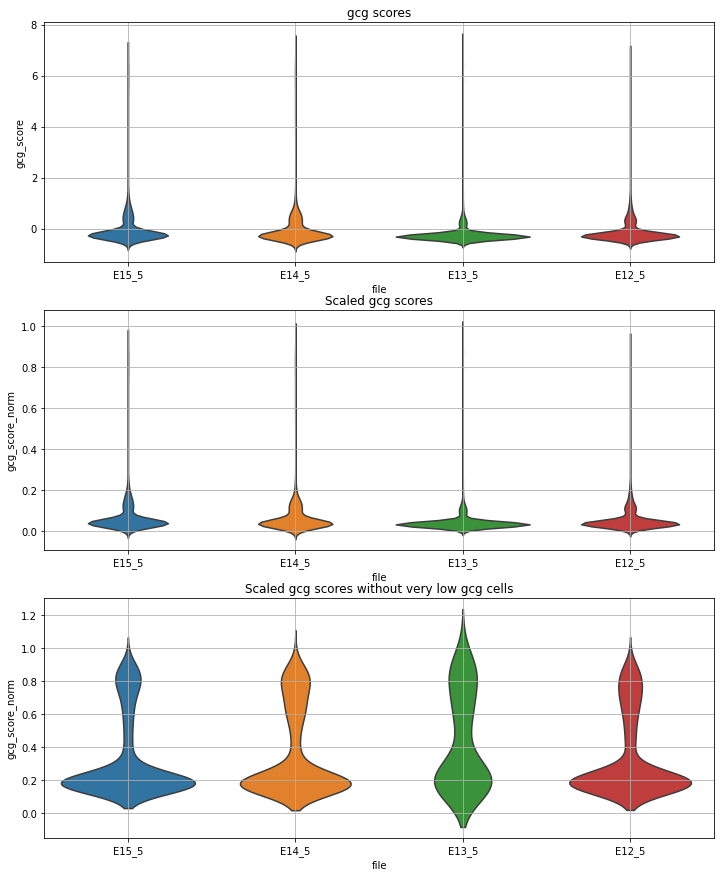

In [10]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.15],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [12]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'E15_5':0.5, 'E14_5':0.4, 'E13_5':0.5, 'E12_5':0.4}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of gcg high across samples:


file   gcg_high
E15_5  False       0.974166
       True        0.025834
E14_5  False       0.969273
       True        0.030727
E13_5  False       0.992912
       True        0.007088
E12_5  False       0.981605
       True        0.018395
Name: gcg_high, dtype: float64

In [13]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

In [ ]:
#### SSt

In [14]:
genes=['Sst']
score_name='sst'

In [15]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-25-dd6dbc0f1476>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


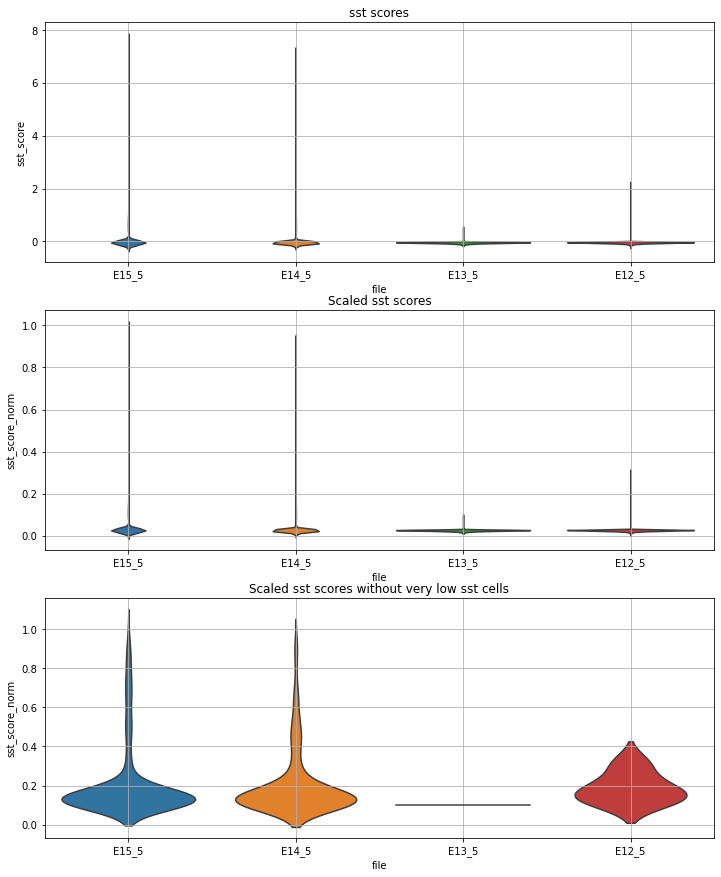

In [25]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.1],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [26]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'E15_5':0.35, 'E14_5':0.35, 'E13_5':0.35, 'E12_5':0.35}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of sst high across samples:


file   sst_high
E15_5  False       0.991772
       True        0.008228
E14_5  False       0.996630
       True        0.003370
E13_5  False       1.000000
E12_5  False       1.000000
Name: sst_high, dtype: float64

In [28]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

In [29]:
#### Ppy

In [30]:
genes=['Ppy']
score_name='ppy'

In [31]:
# Compute score
sc.tl.score_genes(adata_rawnorm, gene_list=genes, score_name=score_name+'_score',  use_raw=False)

<ipython-input-44-6d9ffe2007b1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])


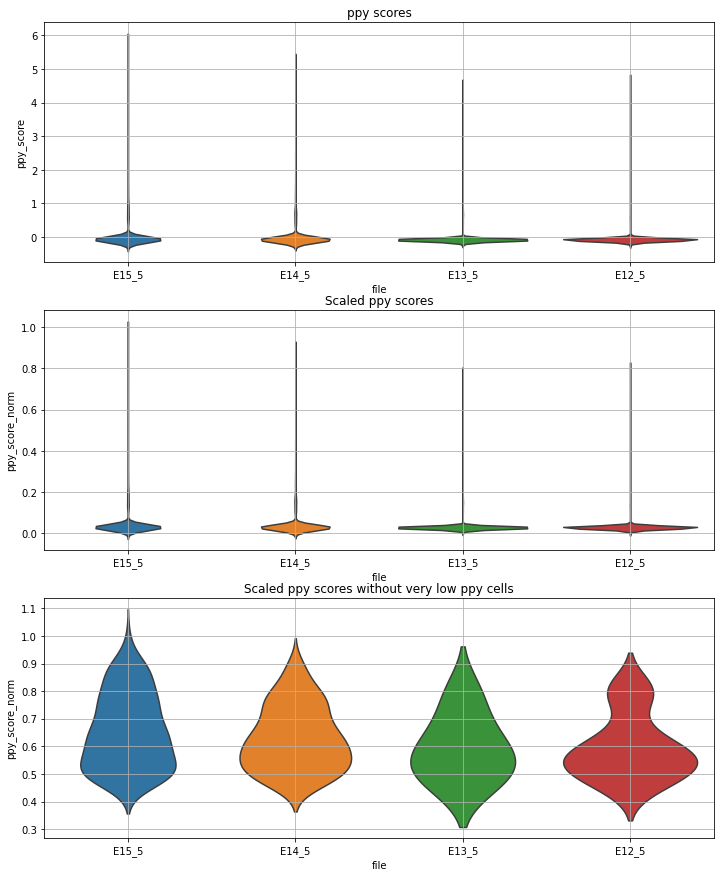

In [44]:
scores=adata_rawnorm.obs[[score_name+'_score','file']]
scores[score_name+'_score_norm']=pp.minmax_scale(scores[score_name+'_score'])
rcParams['figure.figsize']=(12,15)
fig,axs=plt.subplots(3,1)
sb.violinplot(x='file',y=score_name+'_score',data=scores,inner=None,ax=axs[0])
axs[0].title.set_text(score_name+' scores')
axs[0].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores,inner=None,ax=axs[1])
axs[1].title.set_text('Scaled '+score_name+' scores')
axs[1].grid()
sb.violinplot(x='file',y=score_name+'_score_norm',data=scores[scores[score_name+'_score_norm']>0.45],
             inner=None,ax=axs[2])
axs[2].title.set_text('Scaled '+score_name+' scores without very low '+score_name+' cells')
axs[2].grid()

In [45]:
# Find score high cells
# Use different thresholds across files as there might be different ambient counts (or other effects), 
# thus shifting distributions up a bit
file_thresholds={'E15_5':0.72, 'E14_5':0.72, 'E13_5':0.72, 'E12_5':0.72}
adata_rawnorm.obs[score_name+'_high']=scores.apply(lambda x: x[score_name+'_score_norm'] > file_thresholds[x.file], 
                                                   axis=1)
print('Proportion of '+score_name+' high across samples:')
adata_rawnorm.obs[['file',score_name+'_high']].groupby('file')[score_name+'_high'].value_counts(
    normalize=True,sort=False)

Proportion of ppy high across samples:


file   ppy_high
E15_5  False       0.995134
       True        0.004866
E14_5  False       0.996828
       True        0.003172
E13_5  False       0.999803
       True        0.000197
E12_5  False       0.999549
       True        0.000451
Name: ppy_high, dtype: float64

In [46]:
# Add info about score high to main adata and save it
adata.obs[score_name+'_score']=adata_rawnorm.obs[score_name+'_score']
adata.obs[score_name+'_high']=adata_rawnorm.obs[score_name+'_high']

#### Save

In [49]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)